In [1]:
from scipy.signal import find_peaks, peak_prominences
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 10]
import numpy as np
from morning.pipeline.stream.cybos.stock.db.min_excel_tick import MinExcelTick
from morning.pipeline.converter.cybos.stock.day_tick import StockDayTickConverter
import pandas as pd
from datetime import date
from morning.pipeline.stream.cybos.stock.db.min_tick import MinTick
from morning.pipeline.chooser.cybos.db.kosdaq_all_chooser import KosdaqAllChooser
from morning.pipeline.chooser.cybos.db.kosdaq_bull_chooser import KosdaqBullChooser
from morning.back_data.fetch_stock_data import get_day_minute_period_data
from morning.back_data.holidays import is_holidays

from datetime import timedelta, datetime

In [10]:
def find_trend(x, indexes, prominences, is_upper):
    
    if not is_upper and indexes.shape[0] < 3:
        return False, False
    elif is_upper and indexes.shape[0] < 3:
        return False, True
    
    short_trend = x[indexes[-1]] - x[indexes[-2]] > 0
    for i, v1 in enumerate(reversed(indexes)):
        for v2 in reversed(indexes[:indexes.shape[0] - 1 - i]):
            found = True
            for c in indexes:
                if v1 == c or v2 == c: continue
                x1, x2, y1, y2, cx, cy = v1, v2, x[v1], x[v2], c, x[c]
                result = (y1 - y2) * cx + (x2 - x1) * cy + x1 * y2 - x2 * y1

                if (is_upper and result < 0) or (not is_upper and result > 0):
                    found = False
                    break
            
            if found:
                return short_trend, x[v1] - x[v2] > 0
    return short_trend, False

In [11]:
class Receiver:
    def __init__(self):
        self.data = []
    
    def received(self, datas):
        for d in datas:
            self.data.append(d)

def get_reversed(s):
    distance_from_mean = s.mean() - s
    return distance_from_mean + s.mean()

In [12]:
def calculate(df, is_rev, is_debug=False):
    x = None
    if not is_rev:
        x = df['avg']
    else:
        x = df['rev']

    peaks, _ = find_peaks(x, distance=10)
    prominences = peak_prominences(x, peaks)[0]

    peaks = np.extract(prominences > x.mean() * 0.003, peaks)
    prominences = np.extract(prominences > x.mean() * 0.003, prominences)
    peaks = np.r_[np.array([0]), peaks]

    x = df['avg']
    utrend = find_trend(x, peaks, prominences, not is_rev)

    return peaks, prominences, utrend

In [24]:
def handle_graph(data, buy_points, sell_points, code, today, profits, risks):

    df = pd.DataFrame(data)

    df['buy1'] = False
    df['sell1'] = False

    for b1 in buy_points:
        df.loc[df['date'] == b1, 'buy1'] = True

    for s1 in sell_points:
        df.loc[df['date'] == s1, 'sell1'] = True
    #print(buy_points)

    df['avg'] = df['close_price'].rolling(10).mean()
    not_non = df['avg'].notna().idxmax()
    if not_non > 0:
        df['avg'] = df['avg'].fillna(df['avg'].iloc[not_non])
    price = np.array(df['avg'])
    reverse_price = np.array(get_reversed(price))
    df['rev'] = reverse_price
    x = df['avg']

    peaks, prominences, utrend = calculate(df, False)
    peaks_b, prominences_b, utrend_b = calculate(df, True)
    plt.rcParams['figure.figsize'] = [15,20]
    fig, axs = plt.subplots(2)

    axs[0].plot(x)
    axs[0].plot(df['close_price'])
    axs[0].plot(df[df['buy1'] == True].index.values, df.loc[df['buy1'] == True, 'avg'], 'o', color='black', markersize=6)
    axs[0].plot(df[df['sell1'] == True].index.values, df.loc[df['sell1'] == True, 'avg'], 'D', color='red', markersize=6)
    axs[0].plot(peaks, x[peaks], 'x', color='red')
    axs[0].plot(peaks_b, x[peaks_b], 'x', color='blue')
    index_v = df[df['sell1'] == True].index.values
    avg_v = df.loc[df['sell1'] == True, 'avg']
    
    risk_index = df[df['buy1'] == True].index.values
    risk_v = df.loc[df['buy1'] == True, 'avg']
    for i, p in enumerate(profits):
        axs[0].annotate(str(p), (index_v[i], avg_v.iloc[i] * 1.003), fontsize=15)
        
    for i, p in enumerate(risks):
        axs[0].annotate(str(p), (risk_index[i], risk_v.iloc[i] * 1.003), fontsize=15, color='red')
        
    axs[1].plot(df['cum_buy_volume'], color='red')
    axs[1].plot(df['cum_sell_volume'], color='blue')
    plt.savefig(today.strftime('%Y%m%d_') + code + '.png', dpi=300)



In [39]:
def handle(code, today):
    sdtc = StockDayTickConverter()
    gdmpd = get_day_minute_period_data(code, today, today)
    met = MinTick(today)
    met.set_target('cybos:' + code)
    met.set_output(sdtc)
    rcv = Receiver()
    sdtc.set_output(rcv)
    open_price = 0
    stage = 0
    buy_prices = [0, 0]
    buy_points = []
    sell_points = []
    risks = []
    buy_hold = None
    profits = []
    long_price = 0
    while met.received(None) > 0:
        data = rcv.data

        if open_price == 0:
            open_price = data[-1]['start_price']

        if len(data) < 10: continue

        df = pd.DataFrame(data)

        if buy_hold is not None and df['date'].iloc[-1] - buy_hold < timedelta(minutes=10):
            continue

        df['avg'] = df['close_price'].rolling(10).mean()
        not_non = df['avg'].notna().idxmax()
        if not_non > 0:
            df['avg'] = df['avg'].fillna(open_price)

        price = np.array(df['avg'])
        reverse_price = np.array(get_reversed(price))
        df['rev'] = reverse_price
        peaks, prominences, utrend = calculate(df, False)
        peaks_b, prominences_b, utrend_b = calculate(df, True)

        bottom_trend = utrend_b[0] and utrend_b[1]
        roof_trend = utrend[0] and utrend[1]
        cum_sum = (data[-1]['cum_buy_volume'] + data[-1]['cum_sell_volume']) * 0.1
        volume_trend = data[-1]['cum_buy_volume'] > data[-1]['cum_sell_volume'] + cum_sum
        """
        if df['date'].iloc[-1] > datetime(2019, 12, 6, 13, 6):
            print('utrend', utrend_b[0], utrend_b[1])
            calculate(df, True, True)
            break
        """
        if stage == 0:
            bottom_trend = utrend_b[0] and utrend_b[1]
            roof_trend = utrend[0] and utrend[1]
            volume_trend = data[-1]['cum_buy_volume'] > data[-1]['cum_sell_volume']
            price_exceed = (data[-1]['close_price'] - open_price) / open_price * 100. > 15.
            if bottom_trend and not roof_trend and volume_trend and not price_exceed:
                stage = 1
                buy_prices[0] = df['avg'].iloc[peaks[-1]]
                if len(peaks) > 1:
                    buy_prices[1] = df['avg'].iloc[peaks[-2]]
                else:
                    buy_prices[1] = df['avg'].iloc[peaks[-1]]
                #print('Go S1', df['date'].iloc[-1], buy_prices)
                
        elif stage == 1:
            #print(df['date'].iloc[-1], utrend_b[0], utrend_b[1])
            if not volume_trend or not bottom_trend:
                if buy_hold is not None:
                    print('SELL', df['date'].iloc[-1], df['close_price'].iloc[-1])
                    sell_points.append(df['date'].iloc[-1])
                    f = float("{0:.2f}".format((df['close_price'].iloc[-1] - long_price) / long_price * 100.))
                    profits.append(f)
                    buy_hold = None
                stage = 0
            else:
                start_price = df['close_price'].iloc[-5:].min()
                close_price = df['close_price'].iloc[-5:].max()
                risk = float("{0:.2f}".format((close_price - start_price) / start_price * 100.))
                
                if buy_hold is None and (df['avg'].iloc[-1] > buy_prices[0] or df['avg'].iloc[-1] > buy_prices[1]) and risk < 2.:
                    buy_points.append(df['date'].iloc[-1])
                    buy_hold = df['date'].iloc[-1]    
                    
                    print('BUY1', df['date'].iloc[-1], df['close_price'].iloc[-1], 'RISK', risk)
                    risks.append(risk)
                    long_price =  df['close_price'].iloc[-1]

    if len(buy_points) > 0:
        handle_graph(rcv.data, buy_points, sell_points, code, today, profits, risks)
    
    return profits

START 2019-11-11 00:00:00
Length 379
CURRENT: 0
Length 381
CURRENT: 0
Length 380
BUY1 2019-11-11 09:48:00 3085 RISK 1.65
SELL 2019-11-11 12:04:00 3385
CURRENT: 9.72
Length 380
CURRENT: 9.72
Length 381
CURRENT: 9.72
Length 381
BUY1 2019-11-11 10:47:00 18150 RISK 1.11
SELL 2019-11-11 11:03:00 17900
CURRENT: 8.34
Length 379
CURRENT: 8.34
Length 380
BUY1 2019-11-11 11:01:00 25550 RISK 0.79
SELL 2019-11-11 12:34:00 26250
BUY1 2019-11-11 13:26:00 26100 RISK 0.96
SELL 2019-11-11 15:19:00 27600
CURRENT: 16.83
Length 381
BUY1 2019-11-11 12:21:00 244200 RISK 0.7
CURRENT: 16.83
Length 379
CURRENT: 16.83
Length 381
CURRENT: 16.83
Length 378
CURRENT: 16.83
Length 380
CURRENT: 16.83
Length 381
CURRENT: 16.83
Length 381
CURRENT: 16.83
Length 380
CURRENT: 16.83
Length 298
CURRENT: 16.83
Length 381
CURRENT: 16.83
Length 380
CURRENT: 16.83
Length 381
CURRENT: 16.83
START 2019-11-12 00:00:00
Length 381
CURRENT: 16.83
Length 378
CURRENT: 16.83
Length 380
BUY1 2019-11-12 12:12:00 2940 RISK 1.2
SELL 2019-11

c:\users\nnnli\appdata\local\programs\python\python37-32\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


CURRENT: 8.359999999999996
Length 381
BUY1 2019-11-15 10:49:00 143700 RISK 0.84
SELL 2019-11-15 11:25:00 144400
CURRENT: 8.849999999999996
Length 381
CURRENT: 8.849999999999996
Length 381
CURRENT: 8.849999999999996
Length 371
CURRENT: 8.849999999999996
Length 377
CURRENT: 8.849999999999996
Length 381
CURRENT: 8.849999999999996
Length 381
CURRENT: 8.849999999999996
Length 379
CURRENT: 8.849999999999996
Length 381
CURRENT: 8.849999999999996
Length 379
BUY1 2019-11-15 13:29:00 16700 RISK 0.3
SELL 2019-11-15 14:59:00 17250
CURRENT: 12.139999999999997
Length 381
CURRENT: 12.139999999999997
Length 377
CURRENT: 12.139999999999997
Length 380
CURRENT: 12.139999999999997
Length 381
CURRENT: 12.139999999999997
Length 380
CURRENT: 12.139999999999997
Length 379
BUY1 2019-11-15 14:55:00 19900 RISK 1.27
CURRENT: 12.139999999999997
Length 381
CURRENT: 12.139999999999997
Length 373
CURRENT: 12.139999999999997
Length 380
BUY1 2019-11-15 09:32:00 24450 RISK 1.03
SELL 2019-11-15 11:00:00 25200
CURRENT: 15

CURRENT: 18.459999999999994
Length 377
CURRENT: 18.459999999999994
Length 378
CURRENT: 18.459999999999994
Length 381
CURRENT: 18.459999999999994
Length 378
CURRENT: 18.459999999999994
Length 381
CURRENT: 18.459999999999994
Length 380
CURRENT: 18.459999999999994
Length 367
BUY1 2019-11-21 11:57:00 11250 RISK 1.78
SELL 2019-11-21 12:12:00 11250
CURRENT: 18.459999999999994
Length 381
CURRENT: 18.459999999999994
Length 381
CURRENT: 18.459999999999994
Length 381
CURRENT: 18.459999999999994
Length 379
CURRENT: 18.459999999999994
Length 381
CURRENT: 18.459999999999994
Length 381
CURRENT: 18.459999999999994
Length 381
CURRENT: 18.459999999999994
Length 381
CURRENT: 18.459999999999994
Length 377
CURRENT: 18.459999999999994
START 2019-11-22 00:00:00
Length 364
BUY1 2019-11-22 10:34:00 29750 RISK 0.51
SELL 2019-11-22 11:04:00 29650
CURRENT: 18.119999999999994
Length 84
CURRENT: 18.119999999999994
Length 376
CURRENT: 18.119999999999994
Length 144
CURRENT: 18.119999999999994
Length 52
CURRENT: 18.1

CURRENT: 5.379999999999995
Length 380
BUY1 2019-11-28 09:47:00 6260 RISK 0.32
SELL 2019-11-28 10:56:00 6450
CURRENT: 8.419999999999995
Length 381
CURRENT: 8.419999999999995
Length 378
CURRENT: 8.419999999999995
Length 378
CURRENT: 8.419999999999995
Length 376
CURRENT: 8.419999999999995
Length 380
CURRENT: 8.419999999999995
Length 379
CURRENT: 8.419999999999995
Length 381
BUY1 2019-11-28 10:28:00 9640 RISK 1.05
SELL 2019-11-28 11:42:00 9660
CURRENT: 8.629999999999995
Length 380
CURRENT: 8.629999999999995
Length 381
CURRENT: 8.629999999999995
Length 379
BUY1 2019-11-28 09:51:00 6120 RISK 1.15
SELL 2019-11-28 10:55:00 6190
CURRENT: 9.769999999999996
Length 380
CURRENT: 9.769999999999996
Length 381
CURRENT: 9.769999999999996
Length 376
CURRENT: 9.769999999999996
Length 381
CURRENT: 9.769999999999996
Length 381
CURRENT: 9.769999999999996
Length 381
BUY1 2019-11-28 12:14:00 7530 RISK 1.48
SELL 2019-11-28 12:24:00 7450
CURRENT: 8.709999999999996
Length 381
CURRENT: 8.709999999999996
Length 38

CURRENT: 14.829999999999997
Length 378
CURRENT: 14.829999999999997
Length 380
CURRENT: 14.829999999999997
Length 378
CURRENT: 14.829999999999997
Length 381
CURRENT: 14.829999999999997
Length 381
CURRENT: 14.829999999999997
Length 379
BUY1 2019-12-04 09:44:00 1080 RISK 0.93
SELL 2019-12-04 14:25:00 1140
CURRENT: 20.389999999999997
Length 381
BUY1 2019-12-04 11:23:00 3155 RISK 1.43
SELL 2019-12-04 11:33:00 3105
BUY1 2019-12-04 12:06:00 3240 RISK 1.73
SELL 2019-12-04 12:23:00 3180
CURRENT: 16.959999999999994
Length 380
CURRENT: 16.959999999999994
Length 374
CURRENT: 16.959999999999994
Length 381
BUY1 2019-12-04 10:44:00 21750 RISK 0.69
SELL 2019-12-04 10:54:00 21650
BUY1 2019-12-04 11:19:00 21900 RISK 0.69
CURRENT: 16.499999999999993
Length 381
CURRENT: 16.499999999999993
Length 380
CURRENT: 16.499999999999993
Length 381
CURRENT: 16.499999999999993
Length 381
CURRENT: 16.499999999999993
Length 381
CURRENT: 16.499999999999993
Length 381
CURRENT: 16.499999999999993
Length 380
CURRENT: 16.49

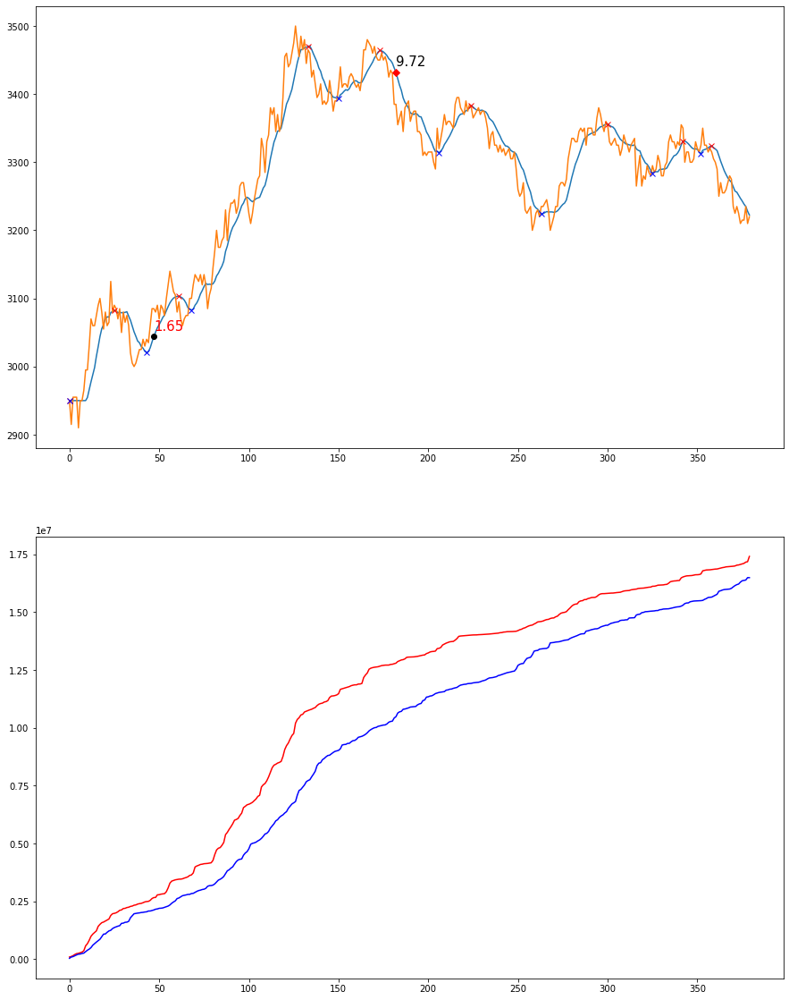

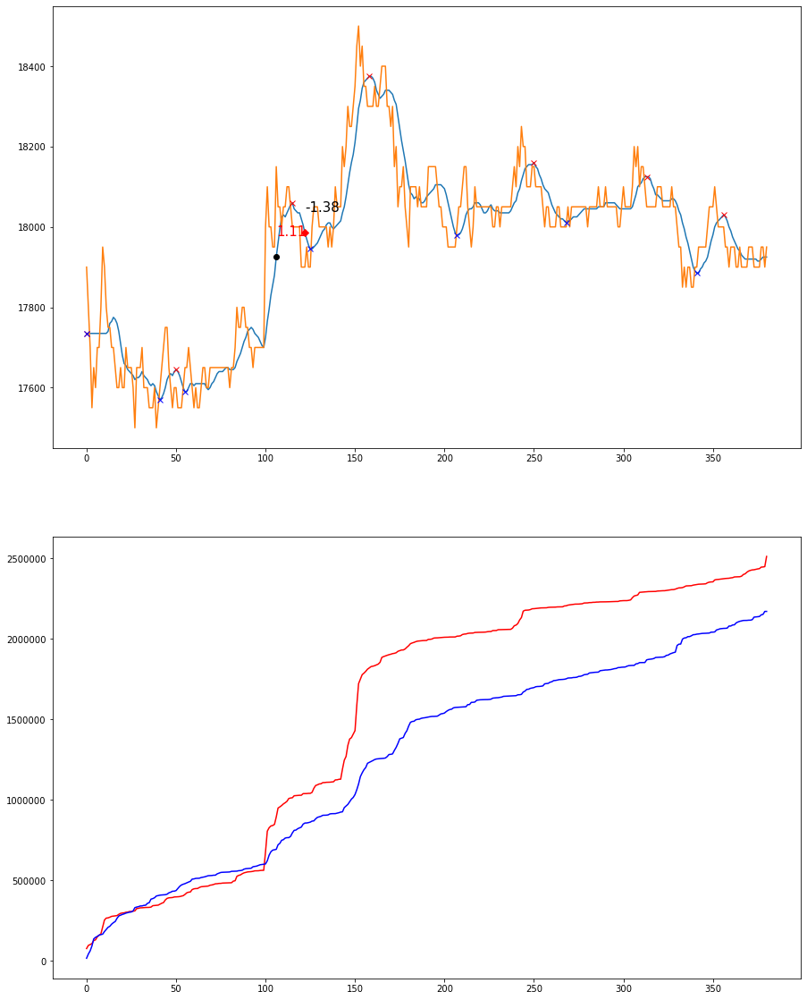

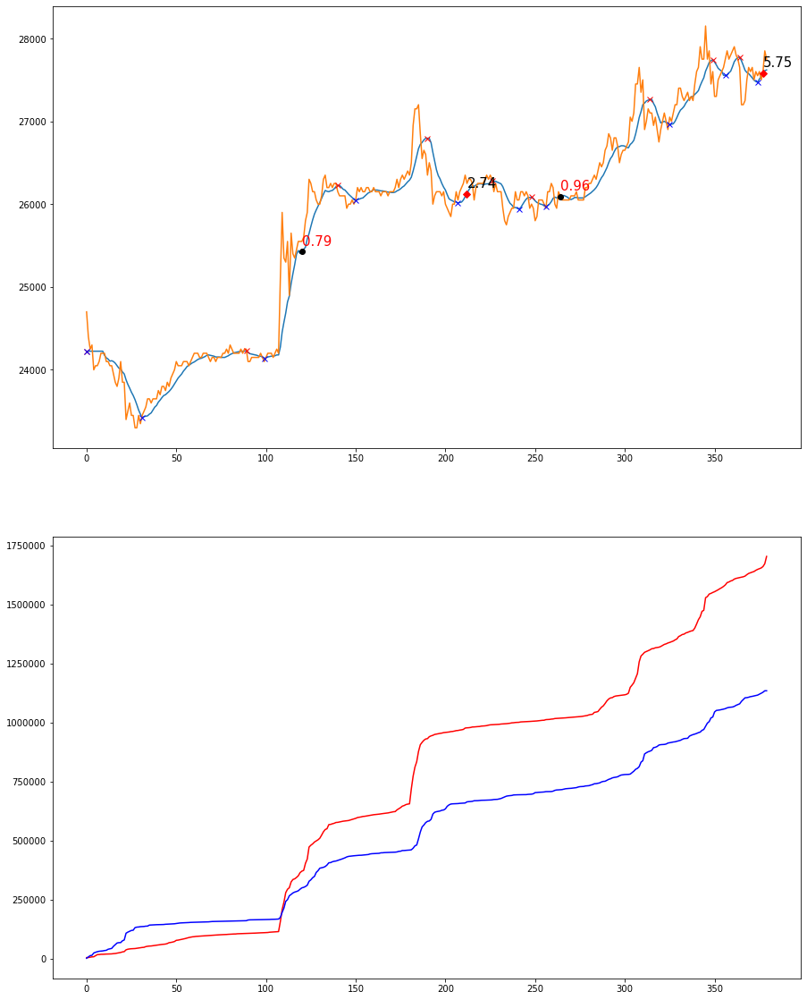

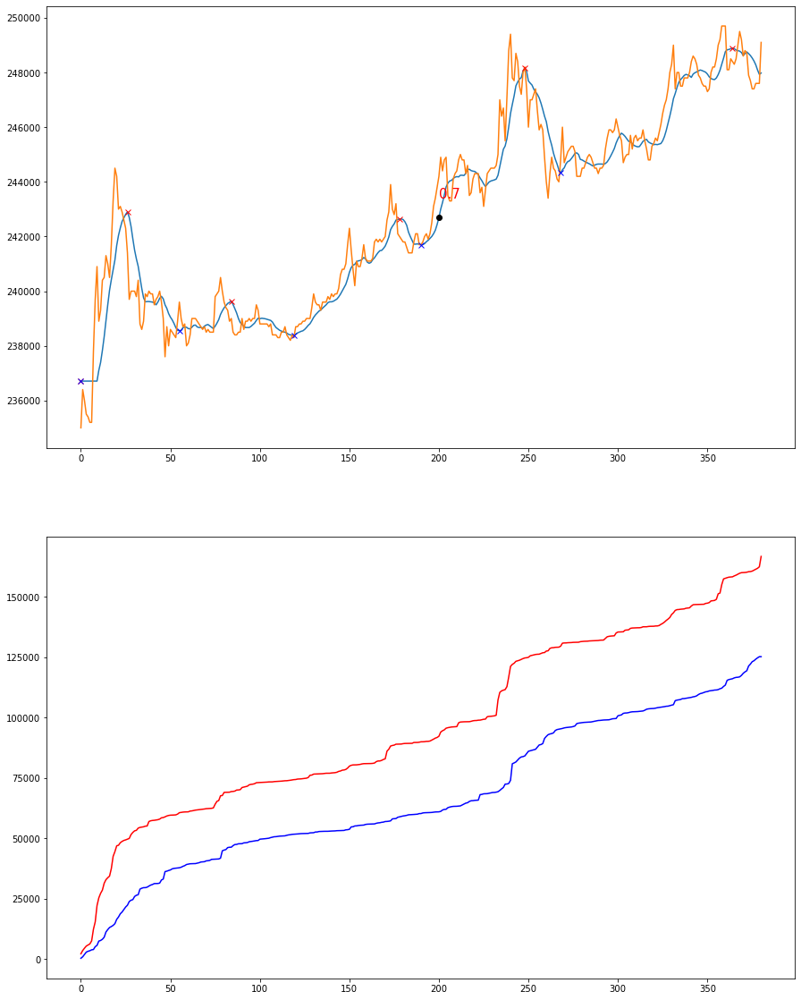

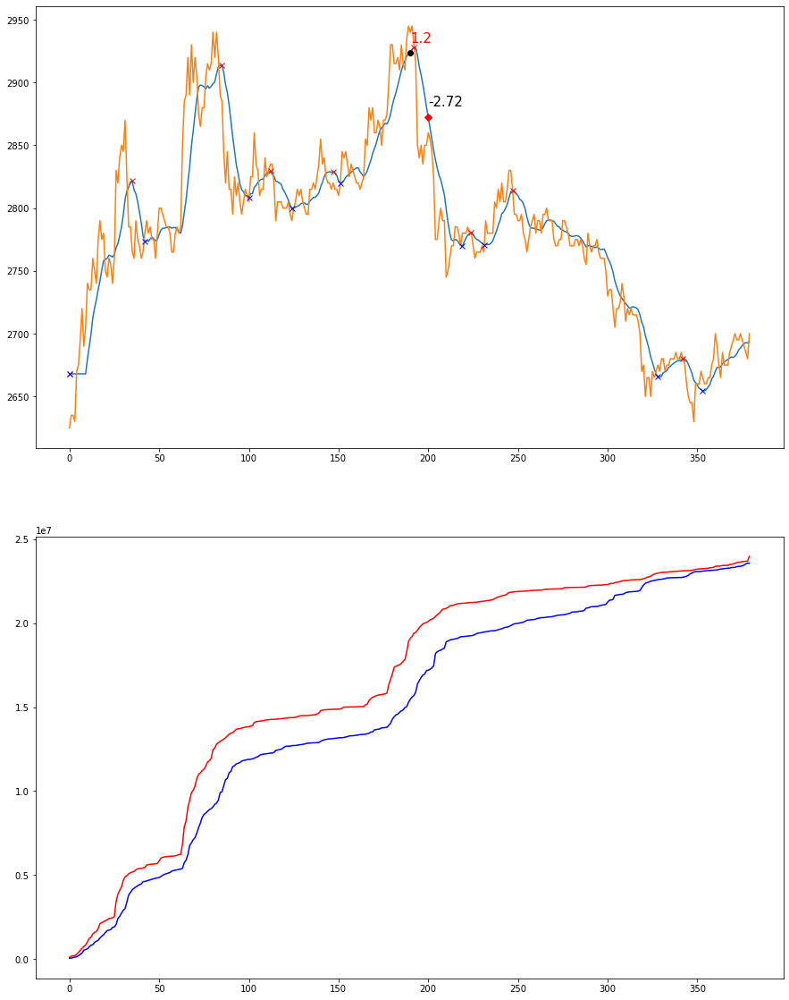

...

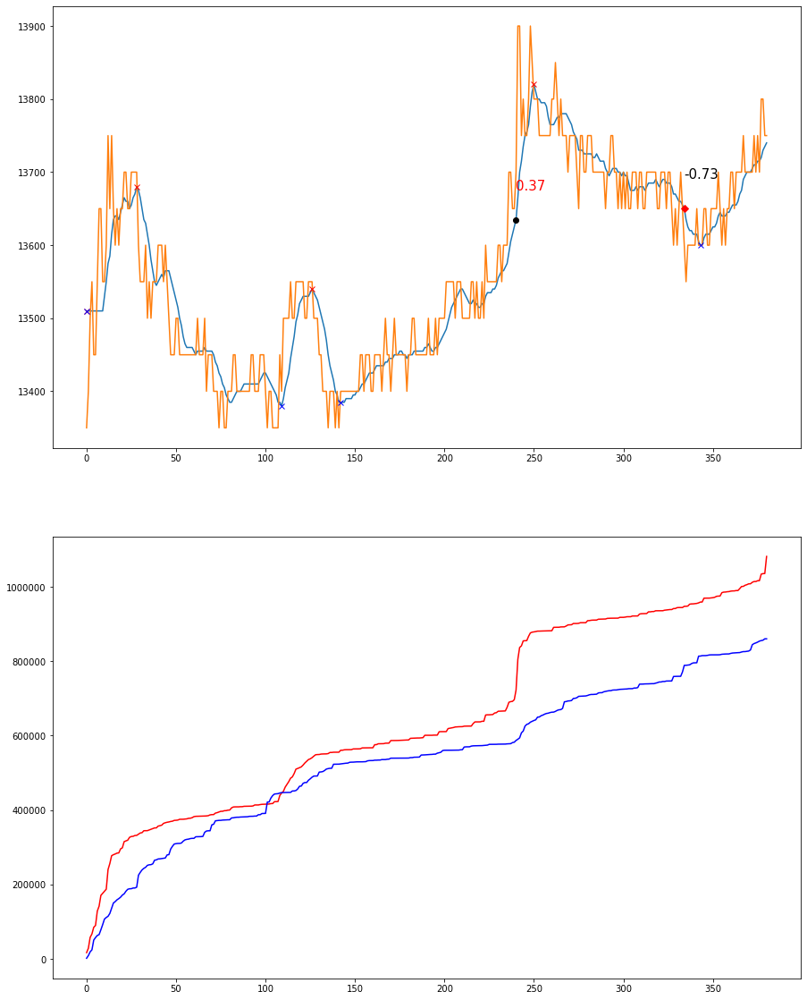

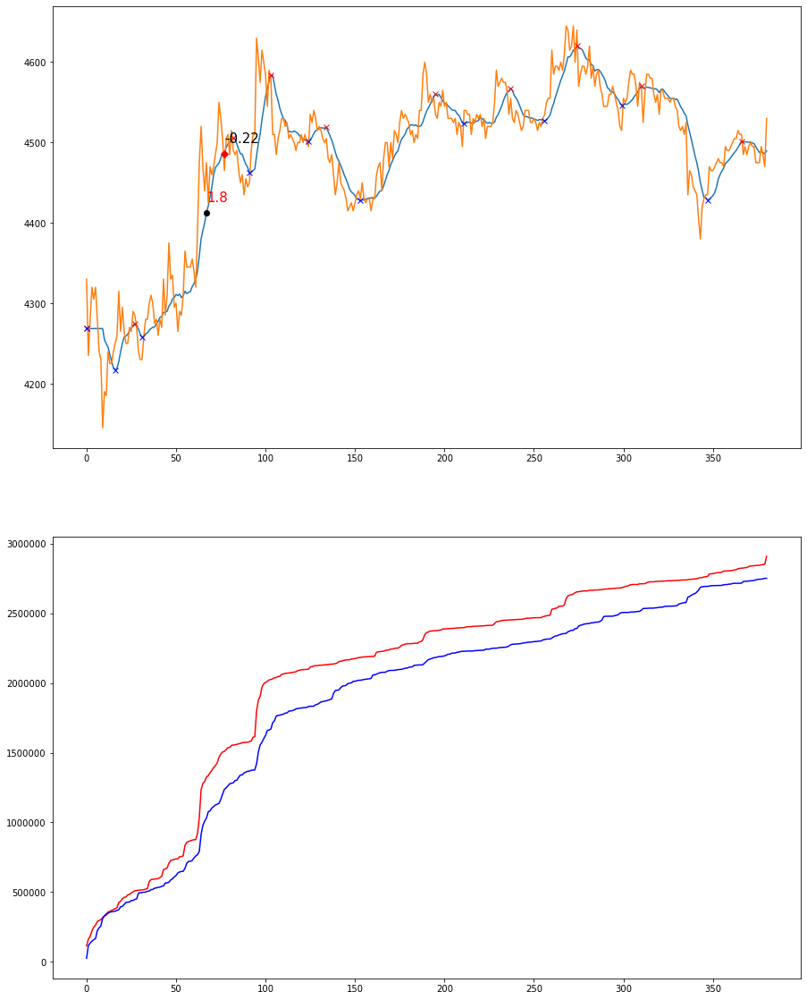

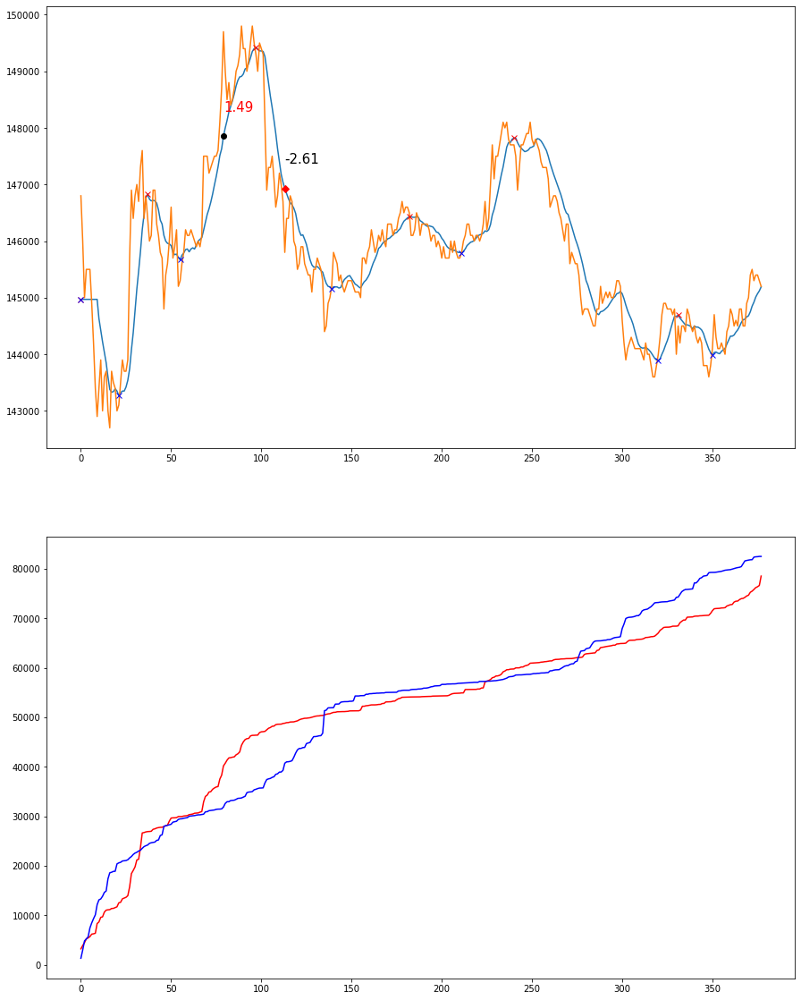

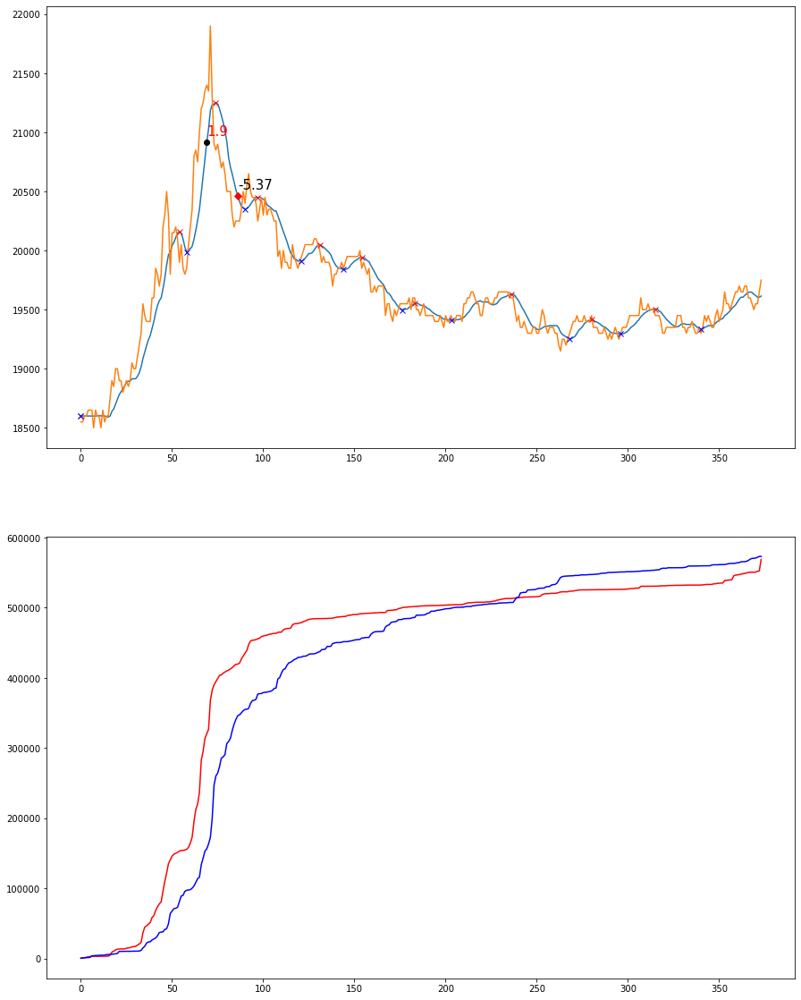

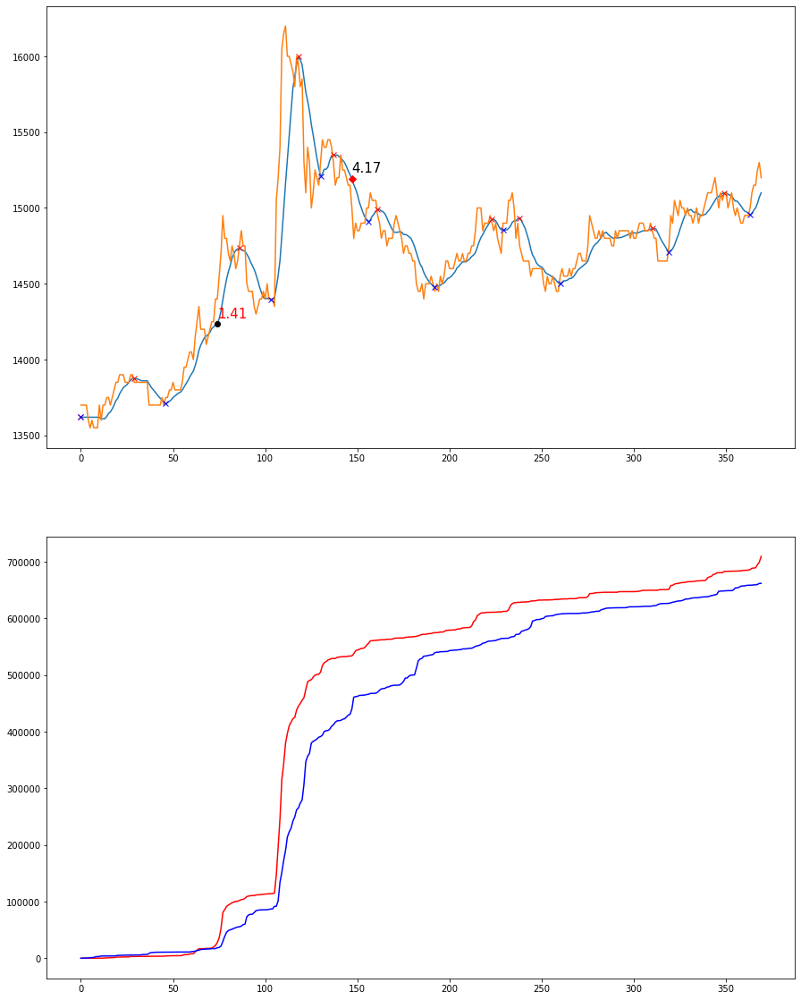

In [40]:
from datetime import date
from morning.back_data.holidays import is_holidays

from_datetime = datetime(2019, 11, 11)
profits = []
while from_datetime < datetime(2019, 12, 7):
    if is_holidays(from_datetime):
        from_datetime += timedelta(days = 1)
        continue
    kbc = KosdaqBullChooser(from_datetime, from_datetime + timedelta(days=1))
    if len(kbc.codes) == 0:
        from_datetime += timedelta(days = 1)
        continue
    print('START', from_datetime)
    codes = kbc.codes[-1].values()
    codes = list(codes)[2:]

    for code in codes:
        profits.extend(handle(code, from_datetime.date()))
        print('CURRENT:', sum(profits))
    from_datetime += timedelta(days = 1)